<a href="https://colab.research.google.com/github/jj2883/camelyon16/blob/master/5_3_tumor_nontumor_Camelyon16_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [12]:
!nvidia-smi


Wed May 15 12:00:46 2019       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 418.56       Driver Version: 410.79       CUDA Version: 10.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P8    15W /  70W |      0MiB / 15079MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [13]:
!apt update && apt install -y openslide-tools
!pip install openslide-python

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran35/ InRelease
Ign:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:3 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:6 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Hit:7 http://security.ubuntu.com/ubuntu bionic-security InRelease
Hit:8 http://archive.ubuntu.com/ubuntu bionic InRelease
Hit:9 http://archive.ubuntu.com/ubuntu bionic-updates InRelease
Hit:10 http://ppa.launchpad.net/marutter/c2d4u3.5/ubuntu bionic InRelease
Hit:12 http://archive.ubuntu.com/ubuntu bionic-backports InRelease
Reading package lists... Done
Building dependency tree       
Reading state information... Done
48 packages can be upgraded. Run 'apt

In [14]:
#mount google drive
from google.colab import drive, files
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 

In [15]:
!ls "/content/drive/My Drive/appdl_final/dataset/dataset"

tumor_001-020.tif   tumor_019.xml	tumor_059.xml	    tumor_091.tif
tumor_001_mask.tif  tumor_023_mask.tif	tumor_064_mask.tif  tumor_091.xml
tumor_001.xml	    tumor_023.tif	tumor_064.tif	    tumor_094_mask.tif
tumor_002_mask.tif  tumor_023.xml	tumor_064.xml	    tumor_094.tif
tumor_002.tif	    tumor_031_mask.tif	tumor_075_mask.tif  tumor_094.xml
tumor_002.xml	    tumor_031.tif	tumor_075.tif	    tumor_096_mask.tif
tumor_005_mask.tif  tumor_031.xml	tumor_075.xml	    tumor_096.tif
tumor_005.tif	    tumor_035_mask.tif	tumor_078_mask.tif  tumor_096.xml
tumor_005.xml	    tumor_035.tif	tumor_078.tif	    tumor_099.xml
tumor_012_mask.tif  tumor_035.xml	tumor_078.xml	    tumor_101_mask.tif
tumor_012.tif	    tumor_038.tif	tumor_081_mask.tif  tumor_101.tif
tumor_012.xml	    tumor_038.xml	tumor_081.tif	    tumor_101.xml
tumor_016_mask.tif  tumor_057_mask.tif	tumor_081.xml	    tumor_110_mask.tif
tumor_016.tif	    tumor_057.tif	tumor_084_mask.tif  tumor_110.tif
tumor_016.xml	    tumor_057.xml	tumor_084.

In [0]:

%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from openslide import open_slide, __library_version__ as openslide_version
import os
from PIL import Image
from skimage.color import rgb2gray


# Read the slides

In [0]:
import os.path as osp
import openslide
from pathlib import Path

#BASE_TRUTH_DIR = Path('')

BASE_TRUTH_DIR = Path('/content/drive/My Drive/appdl_final/dataset/dataset')

slide_path1 = str(BASE_TRUTH_DIR / 'tumor_035.tif')
truth_path1 = str(BASE_TRUTH_DIR / 'tumor_035_mask.tif')

slide1 = openslide.open_slide(slide_path1)
truth1 = openslide.open_slide(truth_path1)


slide_path2 = str(BASE_TRUTH_DIR / 'tumor_002.tif')
truth_path2 = str(BASE_TRUTH_DIR / 'tumor_002_mask.tif')

slide2 = openslide.open_slide(slide_path2)
truth2 = openslide.open_slide(truth_path2)



slide_path3 = str(BASE_TRUTH_DIR / 'tumor_005.tif')
truth_path3 = str(BASE_TRUTH_DIR / 'tumor_005_mask.tif')

slide3 = openslide.open_slide(slide_path3)
truth3 = openslide.open_slide(truth_path3)



slide_path4 = str(BASE_TRUTH_DIR / 'tumor_012.tif')
truth_path4 = str(BASE_TRUTH_DIR / 'tumor_012_mask.tif')

slide4 = openslide.open_slide(slide_path4)
truth4 = openslide.open_slide(truth_path4)


slide_path5 = str(BASE_TRUTH_DIR / 'tumor_016.tif')
truth_path5 = str(BASE_TRUTH_DIR / 'tumor_016_mask.tif')

slide5 = openslide.open_slide(slide_path5)
truth5 = openslide.open_slide(truth_path5)


slide_path6 = str(BASE_TRUTH_DIR / 'tumor_019.tif')
truth_path6 = str(BASE_TRUTH_DIR / 'tumor_019_mask.tif')

slide6 = openslide.open_slide(slide_path6)
truth6 = openslide.open_slide(truth_path6)


slide_path7 = str(BASE_TRUTH_DIR / 'tumor_023.tif')
truth_path7 = str(BASE_TRUTH_DIR / 'tumor_023_mask.tif')

slide7 = openslide.open_slide(slide_path7)
truth7 = openslide.open_slide(truth_path7)


slide_path8 = str(BASE_TRUTH_DIR / 'tumor_031.tif')
truth_path8 = str(BASE_TRUTH_DIR / 'tumor_031_mask.tif')

slide8 = openslide.open_slide(slide_path8)
truth8 = openslide.open_slide(truth_path8)



slide_path9 = str(BASE_TRUTH_DIR / 'tumor_035.tif')
truth_path9 = str(BASE_TRUTH_DIR / 'tumor_035_mask.tif')

slide9 = openslide.open_slide(slide_path9)
truth9 = openslide.open_slide(truth_path9)



slide_path10 = str(BASE_TRUTH_DIR / 'tumor_057.tif')
truth_path10 = str(BASE_TRUTH_DIR / 'tumor_057_mask.tif')

slide10 = openslide.open_slide(slide_path10)
truth10 = openslide.open_slide(truth_path10)



slide_path11 = str(BASE_TRUTH_DIR / 'tumor_059.tif')
truth_path11 = str(BASE_TRUTH_DIR / 'tumor_059_mask.tif')

slide11 = openslide.open_slide(slide_path11)
truth11 = openslide.open_slide(truth_path11)



slide_path12 = str(BASE_TRUTH_DIR / 'tumor_064.tif')
truth_path12 = str(BASE_TRUTH_DIR / 'tumor_064_mask.tif')

slide12 = openslide.open_slide(slide_path12)
truth12 = openslide.open_slide(truth_path12)



slide_path13 = str(BASE_TRUTH_DIR / 'tumor_075.tif')
truth_path13 = str(BASE_TRUTH_DIR / 'tumor_075_mask.tif')

slide13 = openslide.open_slide(slide_path13)
truth13 = openslide.open_slide(truth_path13)



slide_path14 = str(BASE_TRUTH_DIR / 'tumor_078.tif')
truth_path14 = str(BASE_TRUTH_DIR / 'tumor_078_mask.tif')

slide14 = openslide.open_slide(slide_path14)
truth14 = openslide.open_slide(truth_path14)



slide_path15 = str(BASE_TRUTH_DIR / 'tumor_081.tif')
truth_path15 = str(BASE_TRUTH_DIR / 'tumor_081_mask.tif')

slide15 = openslide.open_slide(slide_path15)
truth15 = openslide.open_slide(truth_path15)



slide_path16 = str(BASE_TRUTH_DIR / 'tumor_084.tif')
truth_path16 = str(BASE_TRUTH_DIR / 'tumor_084_mask.tif')

slide16 = openslide.open_slide(slide_path16)
truth16 = openslide.open_slide(truth_path16)



slide_path17 = str(BASE_TRUTH_DIR / 'tumor_091.tif')
truth_path17 = str(BASE_TRUTH_DIR / 'tumor_091_mask.tif')

slide17 = openslide.open_slide(slide_path17)
truth17 = openslide.open_slide(truth_path17)



slide_path18 = str(BASE_TRUTH_DIR / 'tumor_094.tif')
truth_path18 = str(BASE_TRUTH_DIR / 'tumor_094_mask.tif')

slide18 = openslide.open_slide(slide_path18)
truth18 = openslide.open_slide(truth_path18)



slide_path19 = str(BASE_TRUTH_DIR / 'tumor_096.tif')
truth_path19 = str(BASE_TRUTH_DIR / 'tumor_096_mask.tif')

slide19 = openslide.open_slide(slide_path19)
truth19 = openslide.open_slide(truth_path19)



slide_path20 = str(BASE_TRUTH_DIR / 'tumor_101.tif')
truth_path20 = str(BASE_TRUTH_DIR / 'tumor_101_mask.tif')

slide20 = openslide.open_slide(slide_path20)
truth20 = openslide.open_slide(truth_path20)



slide_path21 = str(BASE_TRUTH_DIR / 'tumor_110.tif')
truth_path21 = str(BASE_TRUTH_DIR / 'tumor_110_mask.tif')

slide21 = openslide.open_slide(slide_path21)
truth21 = openslide.open_slide(truth_path21)




# Plot Slides their Mask

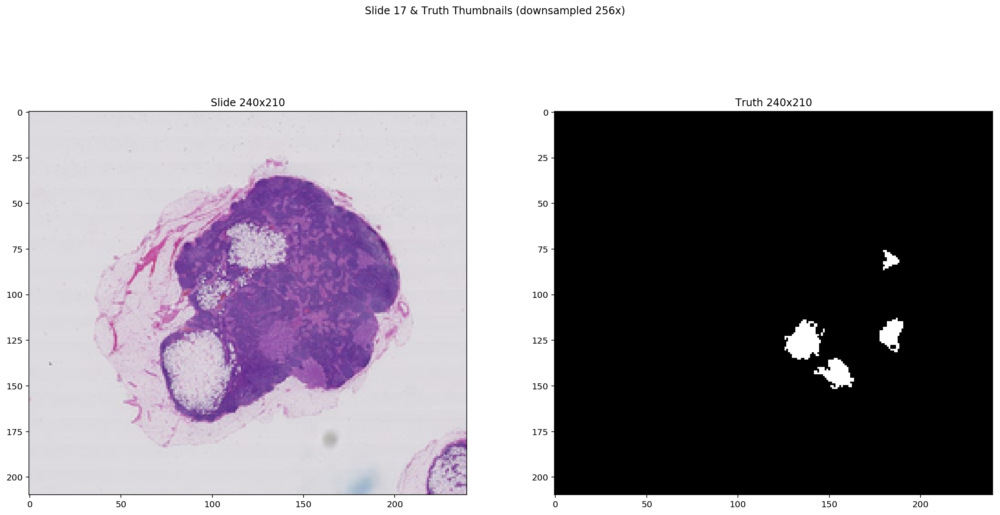

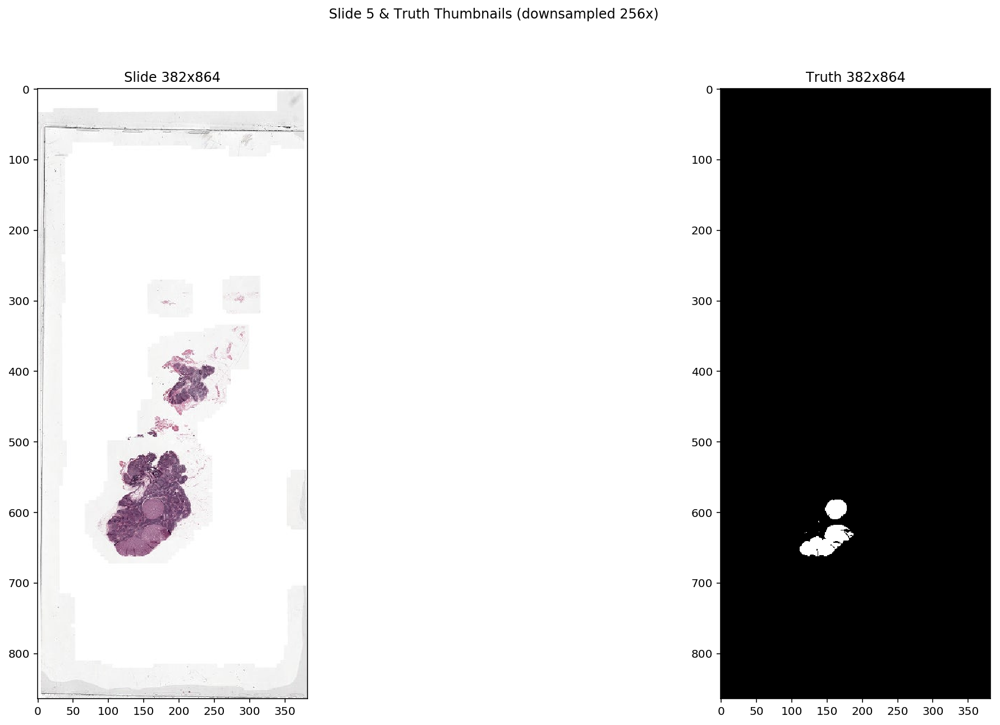

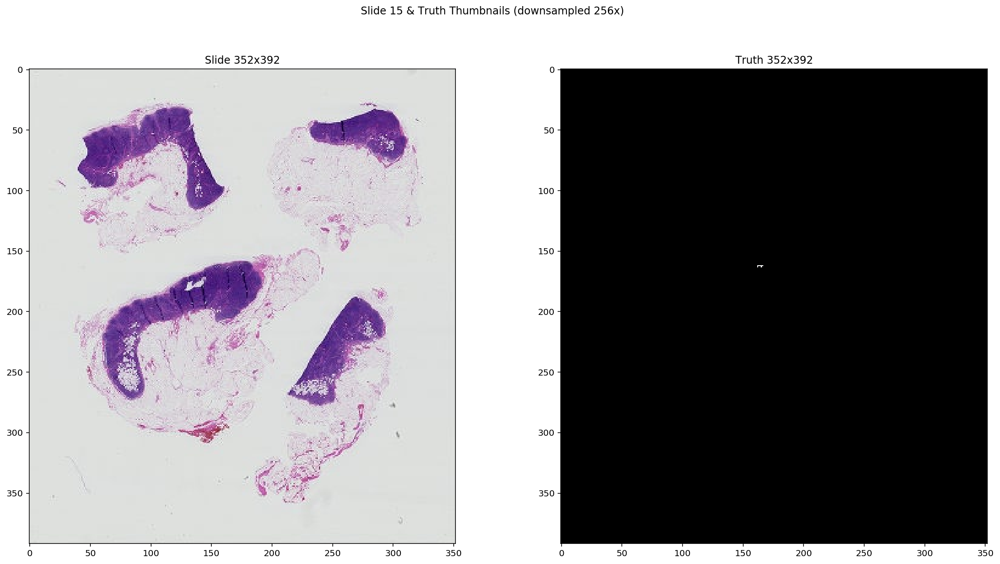

In [18]:
thumbnail = slide17.get_thumbnail((slide17.dimensions[0] / 256, slide17.dimensions[1] / 256))
thumbnail_truth = truth17.get_thumbnail((truth17.dimensions[0] / 256, truth17.dimensions[1] / 256)) 

f, axes = plt.subplots(1, 2, figsize=(20, 10));
ax = axes.ravel()
ax[0].imshow(thumbnail);
ax[0].set_title('Slide %dx%d' % thumbnail.size)
ax[1].imshow(thumbnail_truth.convert('L'), cmap='gray');
ax[1].set_title('Truth %dx%d' % thumbnail_truth.size)
f.suptitle('Slide 17 & Truth Thumbnails (downsampled 256x)');

thumbnail = slide5.get_thumbnail((slide5.dimensions[0] / 256, slide5.dimensions[1] / 256))
thumbnail_truth = truth5.get_thumbnail((truth5.dimensions[0] / 256, truth5.dimensions[1] / 256)) 

f, axes = plt.subplots(1, 2, figsize=(20, 10));
ax = axes.ravel()
ax[0].imshow(thumbnail);
ax[0].set_title('Slide %dx%d' % thumbnail.size)
ax[1].imshow(thumbnail_truth.convert('L'), cmap='gray');
ax[1].set_title('Truth %dx%d' % thumbnail_truth.size)
f.suptitle('Slide 5 & Truth Thumbnails (downsampled 256x)');


thumbnail = slide15.get_thumbnail((slide15.dimensions[0] / 256, slide15.dimensions[1] / 256))
thumbnail_truth = truth15.get_thumbnail((truth15.dimensions[0] / 256, truth15.dimensions[1] / 256)) 

f, axes = plt.subplots(1, 2, figsize=(20, 10));
ax = axes.ravel()
ax[0].imshow(thumbnail);
ax[0].set_title('Slide %dx%d' % thumbnail.size)
ax[1].imshow(thumbnail_truth.convert('L'), cmap='gray');
ax[1].set_title('Truth %dx%d' % thumbnail_truth.size)
f.suptitle('Slide 15 & Truth Thumbnails (downsampled 256x)');



# Transform Slides and Masks into Tiles of 256 X 256 pixels

In [0]:
from skimage.filters import threshold_otsu

from openslide.deepzoom import DeepZoomGenerator 

tiles1 = DeepZoomGenerator(slide1, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth1 = DeepZoomGenerator(truth1, tile_size=256, overlap=0, limit_bounds=False)

tiles2 = DeepZoomGenerator(slide2, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth2 = DeepZoomGenerator(truth2, tile_size=256, overlap=0, limit_bounds=False)

tiles3 = DeepZoomGenerator(slide3, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth3 = DeepZoomGenerator(truth3, tile_size=256, overlap=0, limit_bounds=False)

tiles4 = DeepZoomGenerator(slide4, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth4 = DeepZoomGenerator(truth4, tile_size=256, overlap=0, limit_bounds=False)

tiles5 = DeepZoomGenerator(slide5, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth5 = DeepZoomGenerator(truth5, tile_size=256, overlap=0, limit_bounds=False)

tiles6 = DeepZoomGenerator(slide6, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth6 = DeepZoomGenerator(truth6, tile_size=256, overlap=0, limit_bounds=False)

tiles7 = DeepZoomGenerator(slide7, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth7 = DeepZoomGenerator(truth7, tile_size=256, overlap=0, limit_bounds=False)

tiles8 = DeepZoomGenerator(slide8, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth8 = DeepZoomGenerator(truth8, tile_size=256, overlap=0, limit_bounds=False)

tiles9 = DeepZoomGenerator(slide9, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth9 = DeepZoomGenerator(truth9, tile_size=256, overlap=0, limit_bounds=False)

tiles10 = DeepZoomGenerator(slide10, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth10 = DeepZoomGenerator(truth10, tile_size=256, overlap=0, limit_bounds=False)

tiles11 = DeepZoomGenerator(slide11, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth11 = DeepZoomGenerator(truth11, tile_size=256, overlap=0, limit_bounds=False)

tiles12 = DeepZoomGenerator(slide12, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth12 = DeepZoomGenerator(truth12, tile_size=256, overlap=0, limit_bounds=False)

tiles13 = DeepZoomGenerator(slide13, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth13 = DeepZoomGenerator(truth13, tile_size=256, overlap=0, limit_bounds=False)

tiles14 = DeepZoomGenerator(slide14, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth14 = DeepZoomGenerator(truth14, tile_size=256, overlap=0, limit_bounds=False)

tiles15 = DeepZoomGenerator(slide15, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth15 = DeepZoomGenerator(truth15, tile_size=256, overlap=0, limit_bounds=False)

tiles16 = DeepZoomGenerator(slide16, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth16 = DeepZoomGenerator(truth16, tile_size=256, overlap=0, limit_bounds=False)

tiles17 = DeepZoomGenerator(slide17, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth17 = DeepZoomGenerator(truth17, tile_size=256, overlap=0, limit_bounds=False)

tiles18 = DeepZoomGenerator(slide18, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth18 = DeepZoomGenerator(truth18, tile_size=256, overlap=0, limit_bounds=False)

tiles19 = DeepZoomGenerator(slide19, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth19 = DeepZoomGenerator(truth19, tile_size=256, overlap=0, limit_bounds=False)

tiles20 = DeepZoomGenerator(slide20, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth20 = DeepZoomGenerator(truth20, tile_size=256, overlap=0, limit_bounds=False)

tiles21 = DeepZoomGenerator(slide21, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth21 = DeepZoomGenerator(truth21, tile_size=256, overlap=0, limit_bounds=False)


# print(tiles.level_count)
# print(tiles_truth.level_count)

# print(tiles.level_dimensions[16])
# print(tiles_truth.level_dimensions[15])
# print(tiles.level_tiles[15])
# print(tiles_truth.level_tiles[15])



# Find Only the Tissue Patches comparing Slides with Bianry

In [0]:
def find_patches_from_slide(slide_path, base_truth_dir=BASE_TRUTH_DIR, filter_non_tissue=True):
    """Returns a dataframe of all patches in slide
    input: slide_path: path to WSI file
    output: samples: dataframe with the following columns:
        slide_path: path of slide
        is_tissue: sample contains tissue
        is_tumor: truth status of sample
        tile_loc: coordinates of samples in slide
        
    
    option: base_truth_dir: directory of truth slides
    option: filter_non_tissue: Remove samples no tissue detected
    """
    base_truth_dir = Path(base_truth_dir)
    #slide_contains_tumor = slide_path.startswith('tumor_')
    slide_contains_tumor = osp.basename(slide_path).startswith('tumor_')
    
    
    with openslide.open_slide(slide_path) as slide:
        thumbnail = slide.get_thumbnail((slide.dimensions[0] / 256, slide.dimensions[1] / 256))
    
    thumbnail_grey = np.array(thumbnail.convert('L')) # convert to grayscale
    thresh = threshold_otsu(thumbnail_grey)
    binary = thumbnail_grey > thresh
    
    patches = pd.DataFrame(pd.DataFrame(binary).stack())
    patches['is_tissue'] = ~patches[0]
    patches.drop(0, axis=1, inplace=True)
    patches['slide_path'] = slide_path
    
    if slide_contains_tumor:
 #       truth_slide_path = osp.basename(slide_path).replace('.tif', '_mask.tif')
        truth_slide_path = base_truth_dir / osp.basename(slide_path).replace('.tif', '_mask.tif')
        with openslide.open_slide(str(truth_slide_path)) as truth:
            thumbnail_truth = truth.get_thumbnail((truth.dimensions[0] / 256, truth.dimensions[1] / 256)) 
        
        patches_y = pd.DataFrame(pd.DataFrame(np.array(thumbnail_truth.convert("L"))).stack())
        patches_y['is_tumor'] = patches_y[0] > 0
        patches_y.drop(0, axis=1, inplace=True)

        samples = pd.concat([patches, patches_y], axis=1)
    else:
        samples = patches
        samples['is_tumor'] = False
    
    if filter_non_tissue:
        samples = samples[samples.is_tissue == True] # remove patches with no tissue
    samples['tile_loc'] = list(samples.index)
    samples.reset_index(inplace=True, drop=True)
    return samples

In [21]:
all_tissue_samples1 = find_patches_from_slide(slide_path1)
all_tissue_samples2 = find_patches_from_slide(slide_path2)
all_tissue_samples3 = find_patches_from_slide(slide_path3)
all_tissue_samples4 = find_patches_from_slide(slide_path4)
all_tissue_samples5 = find_patches_from_slide(slide_path5)
all_tissue_samples6 = find_patches_from_slide(slide_path6)
all_tissue_samples7 = find_patches_from_slide(slide_path7)
all_tissue_samples8 = find_patches_from_slide(slide_path8)
all_tissue_samples9 = find_patches_from_slide(slide_path9)
all_tissue_samples10 = find_patches_from_slide(slide_path10)
all_tissue_samples11 = find_patches_from_slide(slide_path11)
all_tissue_samples12 = find_patches_from_slide(slide_path12)
all_tissue_samples13 = find_patches_from_slide(slide_path13)
all_tissue_samples14 = find_patches_from_slide(slide_path14)
all_tissue_samples15 = find_patches_from_slide(slide_path15)
all_tissue_samples16 = find_patches_from_slide(slide_path16)
all_tissue_samples17 = find_patches_from_slide(slide_path17)
all_tissue_samples18 = find_patches_from_slide(slide_path18)
all_tissue_samples19 = find_patches_from_slide(slide_path19)
all_tissue_samples20 = find_patches_from_slide(slide_path20)
all_tissue_samples21 = find_patches_from_slide(slide_path21)

print('Total patches in slide1: %d' % len(all_tissue_samples1))
print('Total patches in slide2: %d' % len(all_tissue_samples2))
print('Total patches in slide3: %d' % len(all_tissue_samples3))

all_tissue_samples1.iloc[:10]
all_tissue_samples2.is_tumor.value_counts()

Total patches in slide1: 13430
Total patches in slide2: 14049
Total patches in slide3: 13166


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


False    14037
True        12
Name: is_tumor, dtype: int64

# Extract the Tissue Patches with Tumor and Non-Tumor

In [0]:
tumor_samples1 = all_tissue_samples1[all_tissue_samples1.is_tumor]
tumor_samples2 = all_tissue_samples2[all_tissue_samples2.is_tumor]
tumor_samples3 = all_tissue_samples3[all_tissue_samples3.is_tumor]
tumor_samples4 = all_tissue_samples4[all_tissue_samples4.is_tumor]
tumor_samples5 = all_tissue_samples5[all_tissue_samples5.is_tumor]
tumor_samples6 = all_tissue_samples6[all_tissue_samples6.is_tumor]
tumor_samples7 = all_tissue_samples7[all_tissue_samples7.is_tumor]
tumor_samples8 = all_tissue_samples8[all_tissue_samples8.is_tumor]
tumor_samples9 = all_tissue_samples9[all_tissue_samples9.is_tumor]
tumor_samples10 = all_tissue_samples10[all_tissue_samples10.is_tumor]
tumor_samples11 = all_tissue_samples11[all_tissue_samples11.is_tumor]
tumor_samples12 = all_tissue_samples12[all_tissue_samples12.is_tumor]
tumor_samples13 = all_tissue_samples13[all_tissue_samples13.is_tumor]
tumor_samples14 = all_tissue_samples14[all_tissue_samples14.is_tumor]
tumor_samples15 = all_tissue_samples15[all_tissue_samples15.is_tumor]
tumor_samples16 = all_tissue_samples16[all_tissue_samples16.is_tumor]
tumor_samples17 = all_tissue_samples17[all_tissue_samples17.is_tumor]
tumor_samples18 = all_tissue_samples18[all_tissue_samples18.is_tumor]
tumor_samples19 = all_tissue_samples19[all_tissue_samples19.is_tumor]
tumor_samples20 = all_tissue_samples20[all_tissue_samples20.is_tumor]
tumor_samples21 = all_tissue_samples21[all_tissue_samples21.is_tumor]



non_tumor_samples1 = all_tissue_samples1[all_tissue_samples1['is_tumor']==False]
non_tumor_samples2 = all_tissue_samples2[all_tissue_samples2['is_tumor']==False]
non_tumor_samples3 = all_tissue_samples3[all_tissue_samples3['is_tumor']==False]
non_tumor_samples4 = all_tissue_samples4[all_tissue_samples4['is_tumor']==False]
non_tumor_samples5 = all_tissue_samples5[all_tissue_samples5['is_tumor']==False]
non_tumor_samples6 = all_tissue_samples6[all_tissue_samples6['is_tumor']==False]
non_tumor_samples7 = all_tissue_samples7[all_tissue_samples7['is_tumor']==False]
non_tumor_samples8 = all_tissue_samples8[all_tissue_samples8['is_tumor']==False]
non_tumor_samples9 = all_tissue_samples9[all_tissue_samples9['is_tumor']==False]
non_tumor_samples10 = all_tissue_samples10[all_tissue_samples10['is_tumor']==False]
non_tumor_samples11 = all_tissue_samples11[all_tissue_samples11['is_tumor']==False]
non_tumor_samples12 = all_tissue_samples12[all_tissue_samples12['is_tumor']==False]
non_tumor_samples13 = all_tissue_samples13[all_tissue_samples13['is_tumor']==False]
non_tumor_samples14 = all_tissue_samples14[all_tissue_samples14['is_tumor']==False]
non_tumor_samples15 = all_tissue_samples15[all_tissue_samples15['is_tumor']==False]
non_tumor_samples16 = all_tissue_samples16[all_tissue_samples16['is_tumor']==False]
non_tumor_samples17 = all_tissue_samples17[all_tissue_samples17['is_tumor']==False]
non_tumor_samples18 = all_tissue_samples18[all_tissue_samples18['is_tumor']==False]
non_tumor_samples19 = all_tissue_samples19[all_tissue_samples19['is_tumor']==False]
non_tumor_samples20 = all_tissue_samples20[all_tissue_samples20['is_tumor']==False]
non_tumor_samples21 = all_tissue_samples21[all_tissue_samples21['is_tumor']==False]

In [23]:
tumor_samples = tumor_samples1
tumor_samples.append(tumor_samples2, ignore_index = True)
tumor_samples.append(tumor_samples3, ignore_index = True)
tumor_samples.append(tumor_samples4, ignore_index = True)
tumor_samples.append(tumor_samples5, ignore_index = True)
tumor_samples.append(tumor_samples6, ignore_index = True)
tumor_samples.append(tumor_samples7, ignore_index = True)
tumor_samples.append(tumor_samples8, ignore_index = True)
tumor_samples.append(tumor_samples9, ignore_index = True)
tumor_samples.append(tumor_samples10, ignore_index = True)
tumor_samples.append(tumor_samples11, ignore_index = True)
tumor_samples.append(tumor_samples12, ignore_index = True)
tumor_samples.append(tumor_samples13, ignore_index = True)
tumor_samples.append(tumor_samples14, ignore_index = True)
tumor_samples.append(tumor_samples15, ignore_index = True)
tumor_samples.append(tumor_samples16, ignore_index = True)
tumor_samples.append(tumor_samples17, ignore_index = True)
tumor_samples.append(tumor_samples18, ignore_index = True)
tumor_samples.append(tumor_samples19, ignore_index = True)
tumor_samples.append(tumor_samples20, ignore_index = True)
tumor_samples=tumor_samples.append(tumor_samples21, ignore_index = True)

non_tumor_samples = non_tumor_samples1
non_tumor_samples.append(non_tumor_samples2, ignore_index = True)
non_tumor_samples.append(non_tumor_samples3, ignore_index = True)
non_tumor_samples.append(non_tumor_samples4, ignore_index = True)
non_tumor_samples.append(non_tumor_samples5, ignore_index = True)
non_tumor_samples.append(non_tumor_samples6, ignore_index = True)
non_tumor_samples.append(non_tumor_samples7, ignore_index = True)
non_tumor_samples.append(non_tumor_samples8, ignore_index = True)
non_tumor_samples.append(non_tumor_samples9, ignore_index = True)
non_tumor_samples.append(non_tumor_samples10, ignore_index = True)
non_tumor_samples.append(non_tumor_samples11, ignore_index = True)
non_tumor_samples.append(non_tumor_samples12, ignore_index = True)
non_tumor_samples.append(non_tumor_samples13, ignore_index = True)
non_tumor_samples.append(non_tumor_samples14, ignore_index = True)
non_tumor_samples.append(non_tumor_samples15, ignore_index = True)
non_tumor_samples.append(non_tumor_samples16, ignore_index = True)
non_tumor_samples.append(non_tumor_samples17, ignore_index = True)
non_tumor_samples.append(non_tumor_samples18, ignore_index = True)
non_tumor_samples.append(non_tumor_samples19, ignore_index = True)
non_tumor_samples.append(non_tumor_samples20, ignore_index = True)
non_tumor_samples=non_tumor_samples.append(non_tumor_samples21, ignore_index = True)



,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(401, 182)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(401, 183)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(402, 183)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(402, 184)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(403, 184)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(404, 183)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(404, 184)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(534, 228)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(535, 229)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(536, 228)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(537, 226)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(537, 227)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(537, 228)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(537, 229)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(299, 187)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(299, 188)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(299, 189)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(299, 190)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(299, 191)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(300, 185)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(300, 186)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(582, 157)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(582, 158)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(582, 161)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(582, 162)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(582, 163)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(582, 164)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(582, 165)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(347, 237)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(347, 239)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(347, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(348, 236)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(348, 237)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(348, 238)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(348, 239)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(471, 152)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(471, 177)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(471, 178)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(472, 153)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(541, 192)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(542, 191)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(542, 192)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(550, 196)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(550, 197)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(551, 195)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(551, 196)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(551, 197)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(551, 204)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(551, 205)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(559, 61)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(559, 62)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(560, 59)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(560, 60)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(560, 62)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(560, 64)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(561, 58)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(468, 212)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(469, 213)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(470, 213)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(471, 214)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(449, 94)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(450, 94)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(450, 95)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(450, 97)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(450, 99)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(450, 102)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(450, 103)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(42, 231)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(42, 232)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(42, 234)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(42, 235)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(42, 245)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(43, 230)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(43, 239)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(26, 170)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(26, 171)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(26, 172)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(27, 169)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(27, 170)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(27, 171)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(28, 168)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(162, 162)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(162, 163)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(162, 164)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(162, 165)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(162, 166)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(163, 162)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(163, 165)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(42, 189)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(43, 184)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(43, 185)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(43, 186)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(43, 189)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(43, 190)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(43, 191)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(76, 180)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(76, 181)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(77, 181)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(77, 182)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(77, 183)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(78, 181)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(78, 182)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(100, 318)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(100, 319)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(100, 320)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(100, 321)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(101, 314)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(101, 315)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(101, 316)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(40, 166)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(40, 170)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(42, 161)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(42, 162)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(42, 166)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(42, 169)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(42, 171)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(341, 153)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(389, 166)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(390, 166)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(51, 392)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(51, 393)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(51, 394)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(51, 395)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(51, 396)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(51, 397)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(52, 390)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


In [24]:
print('Number of Images with Tumor:', tumor_samples.size/4)
print('Number of Images with no Tumor:', non_tumor_samples.size/4)

Number of Images with Tumor: 16059.0
Number of Images with no Tumor: 29344.0


# Extract 10000 Samples from each Tumor and 6000 Non-Tumor Tissues (5:3 Biased Ratio)

In [25]:
from sklearn.utils import shuffle
non_tumor_samples = shuffle(non_tumor_samples)
tumor_samples = shuffle(tumor_samples)

non_tumor_samples_cut = non_tumor_samples.iloc[:6000]
tumor_samples_cut = tumor_samples.iloc[:10000]



print('Number of Images with Tumor:', tumor_samples_cut.size/4)
print('Number of Images with no Tumor:', non_tumor_samples_cut.size/4)

samples = tumor_samples_cut
samples = samples.append(non_tumor_samples_cut, ignore_index= True)
samples = shuffle(samples)

samples

Number of Images with Tumor: 10000.0
Number of Images with no Tumor: 6000.0


,is_tissue,slide_path,is_tumor,tile_loc
4609,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(227, 140)"
7595,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(205, 132)"
6528,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(36, 166)"
8175,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(135, 221)"
15921,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(399, 240)"
9217,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(130, 228)"
6374,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(118, 114)"
2669,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(75, 151)"
13505,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(184, 197)"
12151,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(142, 81)"


# Generate Dataset to Train

In [26]:
import cv2
from keras.utils.np_utils import to_categorical

NUM_CLASSES = 2 # not_tumor, tumor

def gen_imgs(samples, batch_size, base_truth_dir=BASE_TRUTH_DIR, shuffle=True):
    """This function returns a generator that 
    yields tuples of (
        X: tensor, float - [batch_size, 256, 256, 3]
        y: tensor, int32 - [batch_size, 256, 256, NUM_CLASSES]
    )
    
    
    input: samples: samples dataframe
    input: batch_size: The number of images to return for each pull
    output: yield (X_train, y_train): generator of X, y tensors
    
    option: base_truth_dir: path, directory of truth slides
    option: shuffle: bool, if True shuffle samples
    """
    
    num_samples = len(samples)
    while 1: # Loop forever so the generator never terminates
        if shuffle:
            samples = samples.sample(frac=1) # shuffle samples
        
        for offset in range(0, num_samples, batch_size):
            batch_samples = samples.iloc[offset:offset+batch_size]
        
            images = []
            masks = []
            for _, batch_sample in batch_samples.iterrows():
                slide_contains_tumor = osp.basename(batch_sample.slide_path).startswith('tumor_')
                
                with openslide.open_slide(batch_sample.slide_path) as slide:
                    tiles = DeepZoomGenerator(slide, tile_size=256, overlap=0, limit_bounds=False)
                    img = tiles.get_tile(tiles.level_count-1, batch_sample.tile_loc[::-1])



                # only load truth mask for tumor slides
                if slide_contains_tumor:
                    truth_slide_path = base_truth_dir / osp.basename(batch_sample.slide_path).replace('.tif', '_mask.tif')
                    with openslide.open_slide(str(truth_slide_path)) as truth:
                        truth_tiles = DeepZoomGenerator(truth, tile_size=256, overlap=0, limit_bounds=False)
                        mask = truth_tiles.get_tile(truth_tiles.level_count-1, batch_sample.tile_loc[::-1])
                        mask = (cv2.cvtColor(np.array(mask), cv2.COLOR_RGB2GRAY) > 0).astype(int)
                else:
                    mask = np.zeros((256, 256))

                images.append(np.array(img))
                masks.append(mask)

            X_train = np.array(images)
            y_train = np.array(masks)
            y_train = to_categorical(y_train, num_classes=2).reshape(y_train.shape[0], 256, 256, 2)
            yield X_train, y_train





Using TensorFlow backend.


In [27]:
sample_gen = gen_imgs(samples, 32)
sample_gen

<generator object gen_imgs at 0x7f25dbe0d830>

In [28]:
%time example_X, example_y  = next(sample_gen)
#%time example_X, example_y  = next(tumor_sample_gen)


CPU times: user 941 ms, sys: 699 ms, total: 1.64 s
Wall time: 17.4 s


In [29]:
example_X.shape



(32, 256, 256, 3)

In [30]:
example_y.shape
example_y[3].shape


(32, 256, 256, 2)

(256, 256, 2)

CPU times: user 680 ms, sys: 531 ms, total: 1.21 s
Wall time: 13.9 s


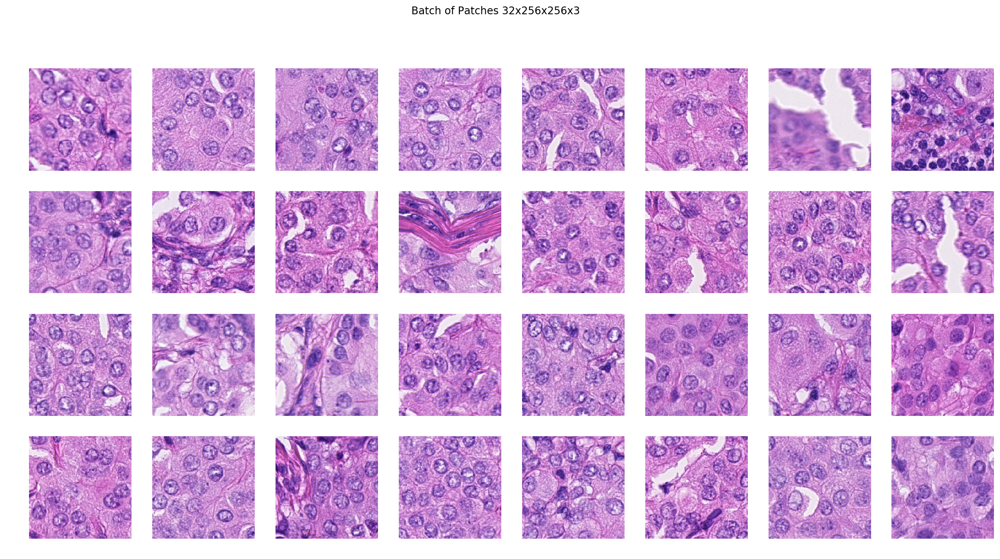

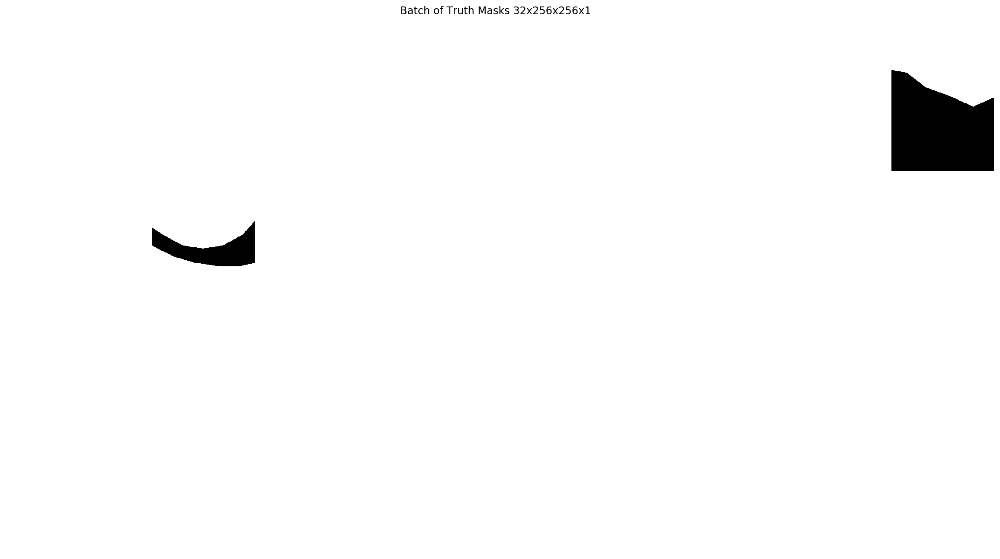

In [32]:
tumor_sample_gen = gen_imgs(tumor_samples.sample(32, random_state=20), 32, shuffle=False)
%time example_X, example_y  = next(tumor_sample_gen)



f, axes = plt.subplots(4, 8, figsize=(20, 10));
ax = axes.flatten()
for i in range(0, example_X.shape[0]):
    _ = ax[i].imshow(example_X[i]);
    _ = ax[i].axis('off');
f.suptitle('Batch of Patches 32x256x256x3');
    
f, axes = plt.subplots(4, 8, figsize=(20, 10));
ax = axes.flatten()    
for i in range(0, example_X.shape[0]):
    _ = ax[i].imshow(example_y[i].argmax(axis=2),  cmap='gray', vmin=0, vmax=1);
    _ = ax[i].axis('off');
f.suptitle('Batch of Truth Masks 32x256x256x1');

In [33]:
from keras.models import Sequential
from keras.layers import Lambda, Dropout
from keras.layers.convolutional import Convolution2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D

model = Sequential()
model.add(Lambda(lambda x: x / 255.0 - 0.5, input_shape=(256, 256, 3)))
model.add(Convolution2D(100, (5, 5), strides=(2, 2), activation='elu', padding='same'))
model.add(MaxPooling2D())
model.add(Convolution2D(200, (5, 5), strides=(2, 2), activation='elu', padding='same'))
model.add(MaxPooling2D())
model.add(Convolution2D(300, (3, 3), activation='elu', padding='same'))
model.add(Convolution2D(400, (3, 3), activation='elu',  padding='same'))
model.add(Dropout(0.1))
model.add(Convolution2D(2, (1, 1))) # this is called upscore layer for some reason?
model.add(Conv2DTranspose(2, (31, 31), strides=(16, 16), activation='softmax', padding='same'))

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [34]:
model.summary()


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lambda_1 (Lambda)            (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 100)     7600      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 64, 64, 100)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 200)       500200    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 16, 16, 200)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 16, 16, 300)       540300    
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 16, 16, 300)       810300    
__________

In [0]:
BATCH_SIZE = 32
N_EPOCHS = 2

NUM_SAMPLES = 10000



In [0]:
from sklearn.model_selection import StratifiedShuffleSplit

# split samples into train and validation set
# use StratifiedShuffleSplit to ensure both sets have same proportions of tumor patches
split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_index, test_index in split.split(samples, samples["is_tumor"]):
        train_samples = samples.loc[train_index]
        val_test_samples = samples.loc[test_index]
      
      
split1 = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=42)
for train_index, test_index in split1.split(val_test_samples, val_test_samples["is_tumor"]):
        validation_samples = samples.loc[train_index]
        test_samples = samples.loc[test_index]

In [0]:
print(train_samples.size)
print(validation_samples.size)
print(test_samples.size)


In [37]:

from datetime import datetime

## TODO Add checkpoint mechanism to save old model before generating new

train_generator = gen_imgs(train_samples, BATCH_SIZE)
validation_generator = gen_imgs(validation_samples, BATCH_SIZE)

# Train model
train_start_time = datetime.now()
history = model.fit_generator(train_generator, np.ceil(len(train_samples) / BATCH_SIZE),
    validation_data=validation_generator,
    validation_steps=np.ceil(len(validation_samples) / BATCH_SIZE),
    epochs=N_EPOCHS)

train_end_time = datetime.now()
print("Model training time: %.1f minutes" % ((train_end_time - train_start_time).seconds / 60,))

Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Deprecated in favor of operator or tf.math.divide.
Epoch 1/2
400/400 [==============================] - 2713s 7s/step - loss: 0.1655 - acc: 0.9383 - val_loss: 0.1047 - val_acc: 0.9626
Epoch 2/2
400/400 [==============================] - 2344s 6s/step - loss: 0.1019 - acc: 0.9640 - val_loss: 0.0971 - val_acc: 0.9674


Model training time: 84.3 minutes


In [0]:
# Save model
model.save('model.h5')

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
 
epochs = range(len(acc))
 
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
 
plt.figure()
 
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
 
plt.show()

In [0]:
test_sample = gen_imgs(test_samples.sample(32, random_state=20), 32, shuffle=False)
%time example_X, example_y  = next(test_sample)



f, axes = plt.subplots(4, 8, figsize=(20, 10));
ax = axes.flatten()
for i in range(0, example_X.shape[0]):
    _ = ax[i].imshow(example_X[i]);
    _ = ax[i].axis('off');
f.suptitle('Test Batch of Patches 32x256x256x3');
    
f, axes = plt.subplots(4, 8, figsize=(20, 10));
ax = axes.flatten()    
for i in range(0, example_X.shape[0]):
    _ = ax[i].imshow(example_y[i].argmax(axis=2),  cmap='gray', vmin=0, vmax=1);
    _ = ax[i].axis('off');
f.suptitle('Test Batch of Truth Masks 32x256x256x1');

In [0]:
def predict_from_model(patch, model):
    """Predict which pixels are tumor.
    
    input: patch: 256x256x3, rgb image
    input: model: keras model
    output: prediction: 256x256x1, per-pixel tumor probability
    """
    
    prediction = model.predict(patch.reshape(1, 256, 256, 3))
    prediction = prediction[:, :, :, 1].reshape(256, 256)
    return prediction

In [0]:
import matplotlib.gridspec as gridspec

def plot_blend(patch, prediction, ax, alpha=0.75):
    """alpha blend patch and prediction.
    https://matplotlib.org/examples/pylab_examples/layer_images.html
    
    input: patch: 256x256x3, rgb image
    input: prediction: 256x256x1, per-pixel tumor probability
    input: ax: maplotlib Axes object
    input: alpha: alpha blend
    """
    
    dx, dy = 0.05, 0.05
    x = np.arange(0, patch.shape[1] - 1, dx)
    y = np.arange(0, patch.shape[0] - 1, dy)
    xmin, xmax, ymin, ymax = np.amin(x), np.amax(x), np.amin(y), np.amax(y)
    extent = xmin, xmax, ymin, ymax

    # fig = plt.figure(frameon=False, figsize=(10, 5))
    Z1 = cv2.cvtColor(patch, code=cv2.COLOR_RGB2GRAY)
    Z2 = prediction

    im1 = ax.imshow(Z1, cmap='gray', extent=extent)
    im2 = ax.imshow(Z2, cmap='jet', alpha=alpha, vmin=0.0, vmax=1.0,
                     extent=extent)
    ax.axis('off');
def plot_patch_with_pred(patch, truth, prediction, title_str='', alpha=0.6):
    """
    input: patch: 256x256x3, rgb image
    input: truth: 256x256x2, onehot output classes (not_tumor, tumor)
    input: prediction: 256x256x1, per-pixel tumor probability
    """
    gs = gridspec.GridSpec(2, 4, width_ratios=[10, 10, 19, 1])
    ax0 = plt.subplot(gs[0, 0])
    ax1 = plt.subplot(gs[0, 1])
    ax2 = plt.subplot(gs[1, 0])
    ax3 = plt.subplot(gs[1, 1])
    ax4 = plt.subplot(gs[:, 2])
    axc = plt.subplot(gs[:, 3])

    ax0.imshow(patch);
    ax0.set_title('Original')
    
    ax1.imshow(truth.argmax(axis=2), cmap='gray', vmin=0, vmax=1);
    ax1.set_title('Truth mask (white=tumor, black=not_tumor)')
    
    p = ax2.imshow(prediction, cmap='jet', vmin=0, vmax=1);
    ax2.set_title('Prediction heatmap')

    ax3.imshow((prediction > 0.5).astype(np.int), cmap='gray', vmin=0, vmax=1);
    ax3.set_title('Prediction mask (white=tumor, black=not_tumor)')
    
    plot_blend(patch, prediction, ax4, alpha)
    ax4.set_title('Original+Prediction blend')
    
    fig = plt.gcf()
    fig.set_size_inches(20, 10)
    fig.suptitle(title_str)
    fig.colorbar(p, cax=axc, orientation="vertical")
    axc.set_title('Probability pixel is tumor')














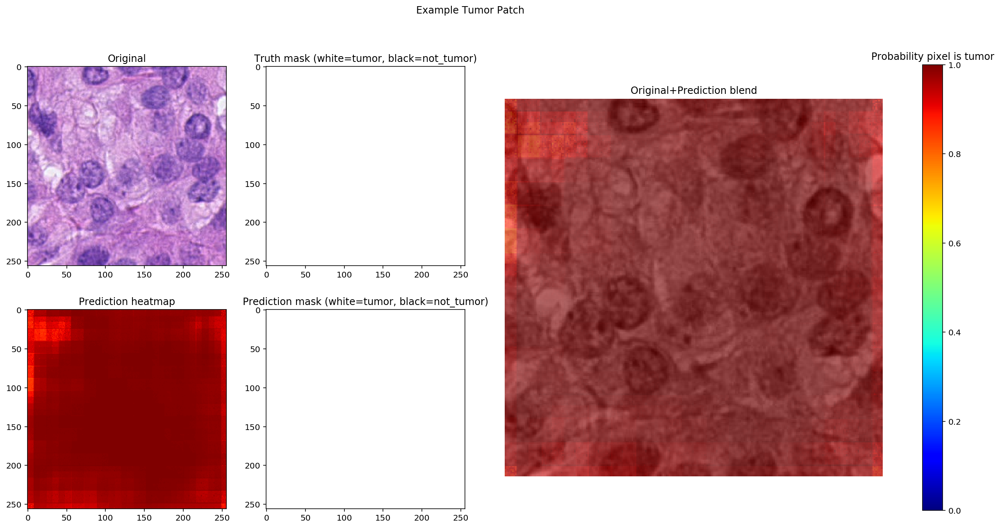

In [41]:
example_patch = example_X[-1]
example_truth = example_y[-1]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example Tumor Patch')

count    65536.000000
mean         0.983054
std          0.022779
min          0.816276
25%          0.980695
50%          0.991337
75%          0.996533
max          0.999588
dtype: float64


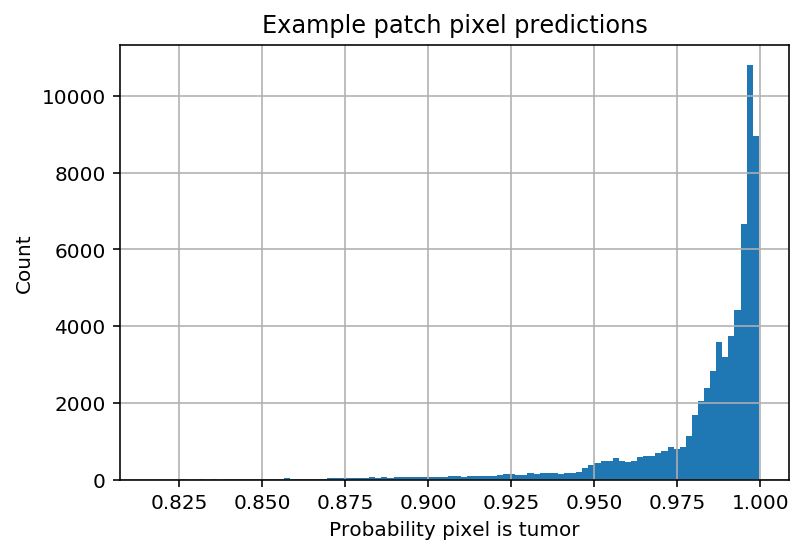

In [42]:
pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

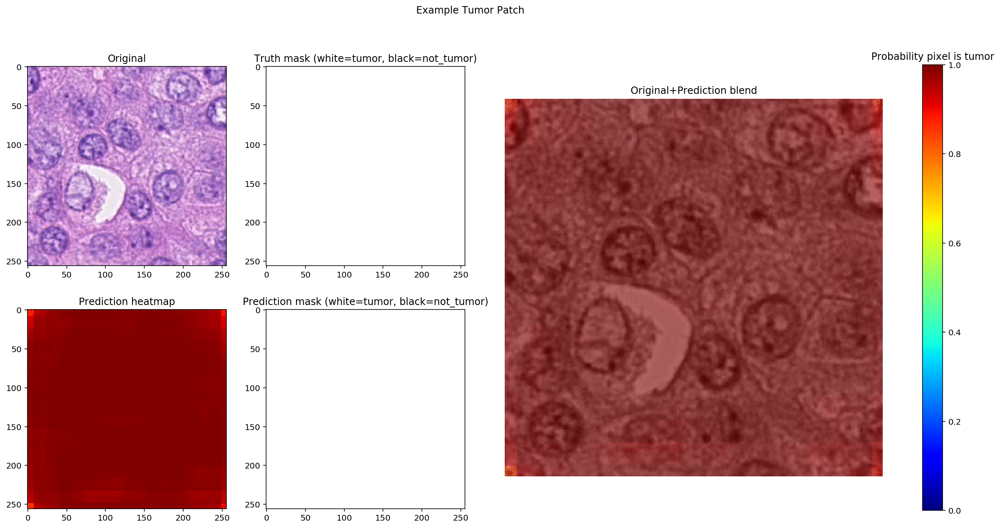

In [43]:
example_patch = example_X[-2]
example_truth = example_y[-2]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example Tumor Patch')

count    65536.000000
mean         0.992948
std          0.011243
min          0.803670
25%          0.991920
50%          0.996367
75%          0.998305
max          0.999784
dtype: float64


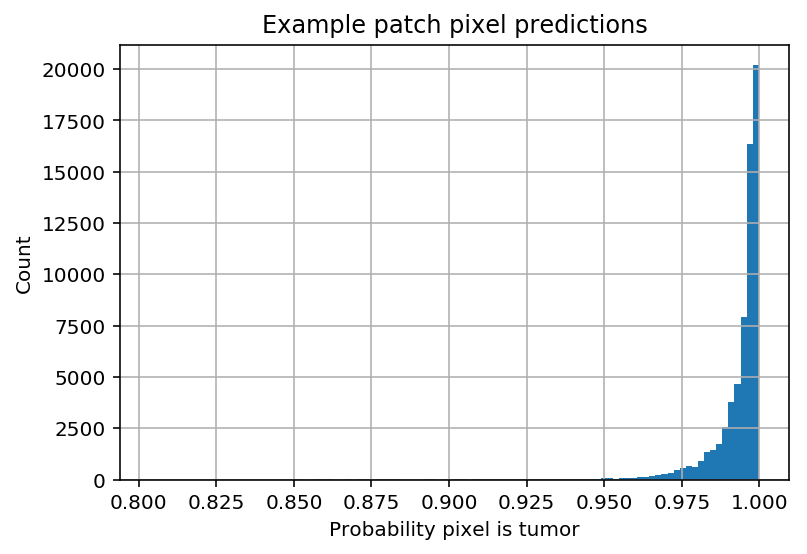

In [44]:
pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

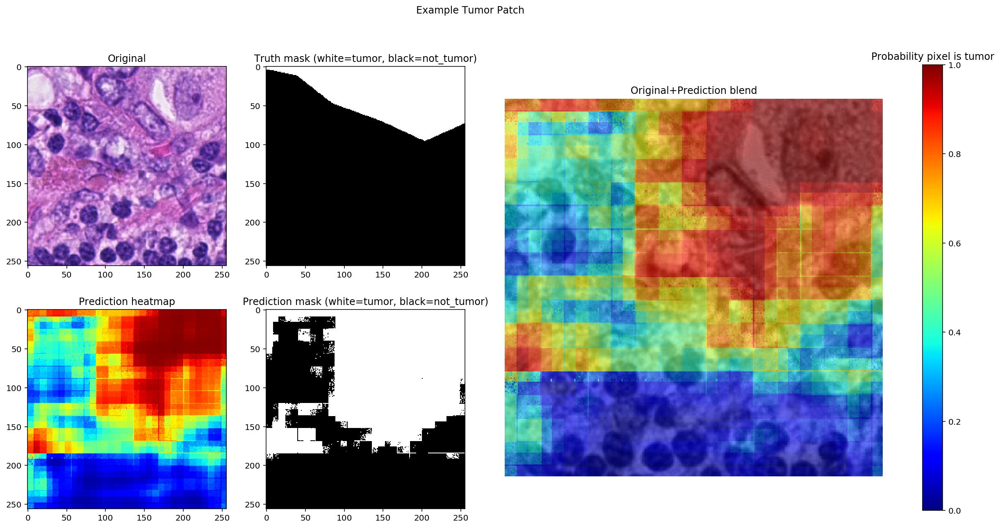

In [45]:
example_patch = example_X[7]
example_truth = example_y[7]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example Tumor Patch')

count    65536.000000
mean         0.518836
std          0.311624
min          0.015210
25%          0.235603
50%          0.493616
75%          0.806540
max          0.997776
dtype: float64


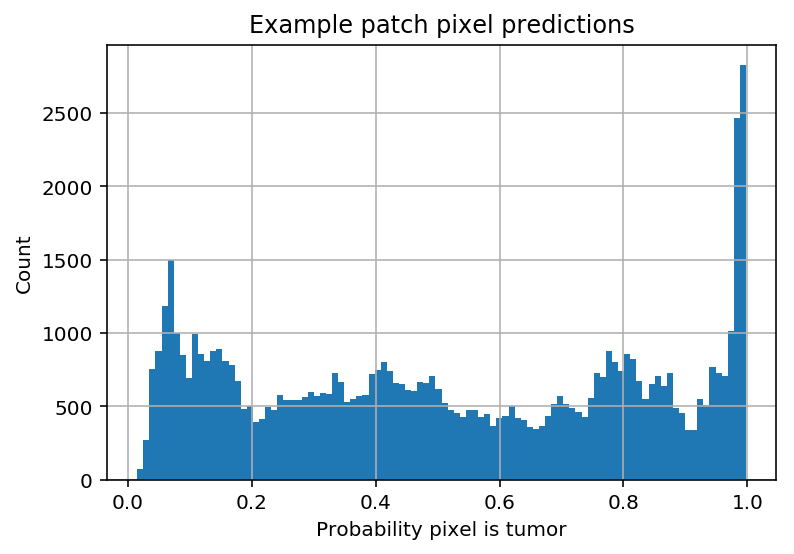

In [46]:

pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

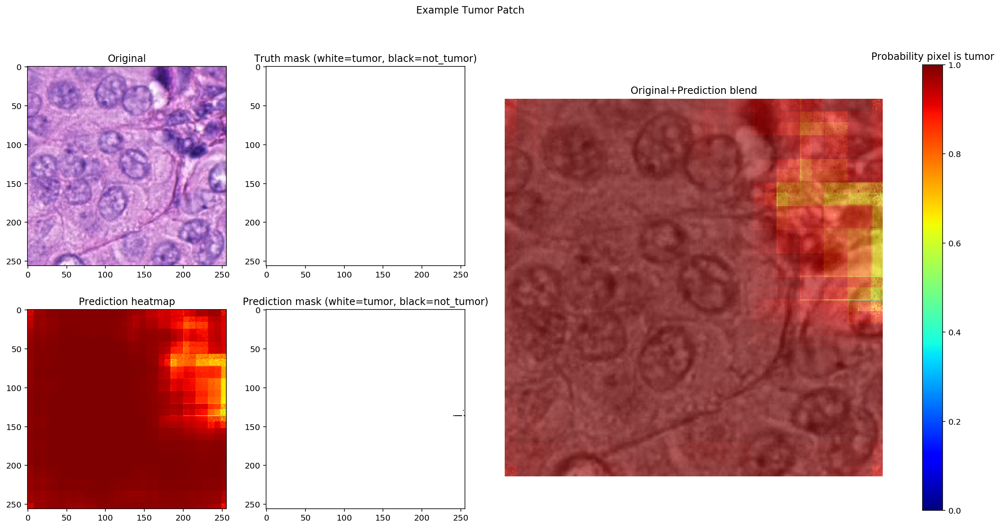

In [47]:
example_patch = example_X[8]
example_truth = example_y[8]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example Tumor Patch')

count    65536.000000
mean         0.970471
std          0.055749
min          0.328238
25%          0.976564
50%          0.993533
75%          0.998126
max          0.999793
dtype: float64


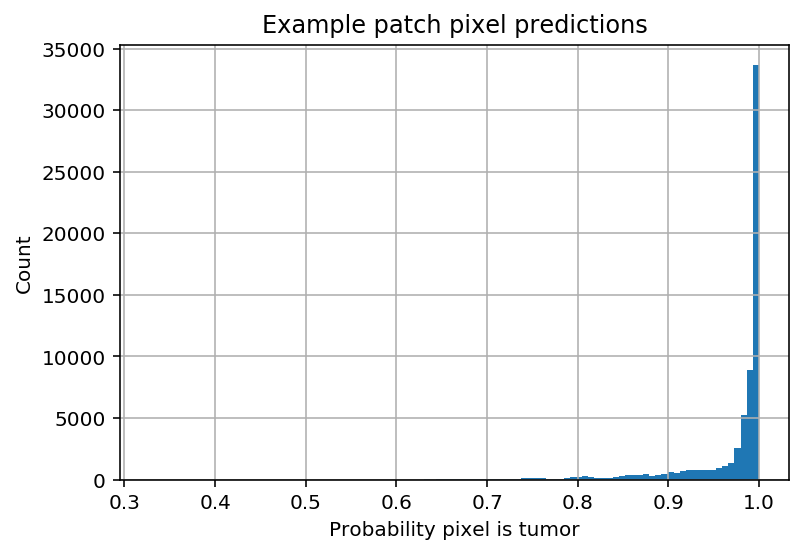

In [48]:
pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

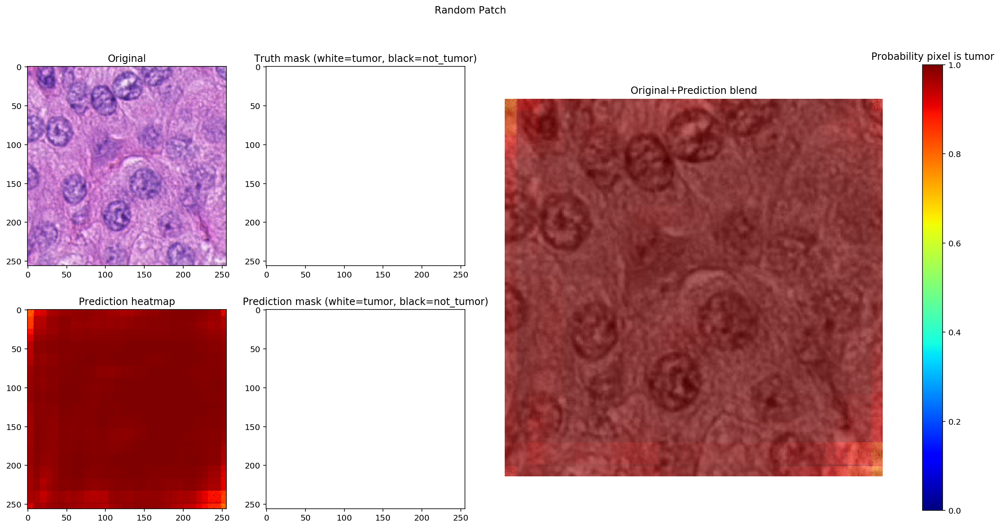

In [49]:
def get_random_patch_from_samples(samples, random_state=None):
    X_i, y_i = next(gen_imgs(samples.sample(1, random_state=random_state), 1))
    return X_i, y_i

X_i, y_i = get_random_patch_from_samples(samples)
pred_i = predict_from_model(X_i, model)
plot_patch_with_pred(X_i[0], y_i[0], pred_i, title_str='Random Patch')

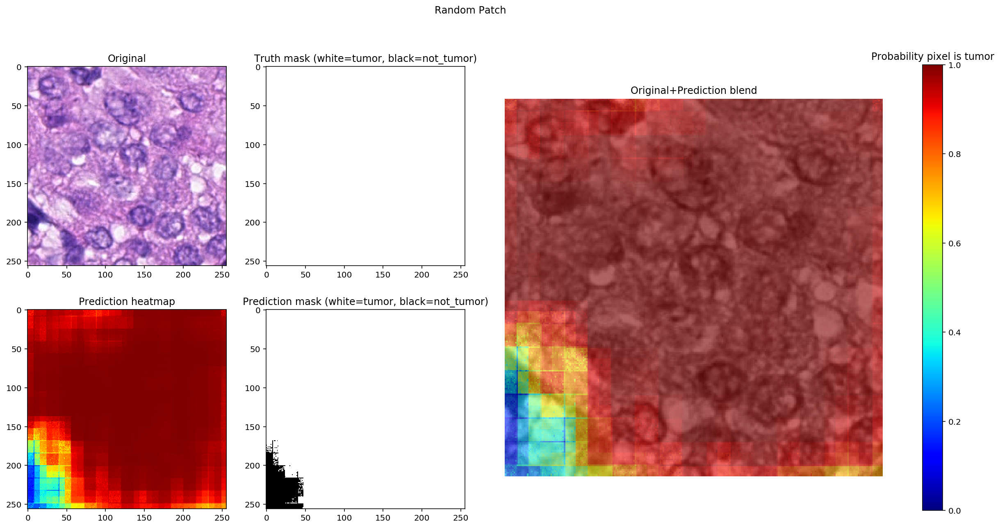

In [50]:
def get_random_patch_from_samples(samples, random_state=None):
    X_i, y_i = next(gen_imgs(samples.sample(1, random_state=random_state), 1))
    return X_i, y_i

X_i, y_i = get_random_patch_from_samples(samples)
pred_i = predict_from_model(X_i, model)
plot_patch_with_pred(X_i[0], y_i[0], pred_i, title_str='Random Patch')

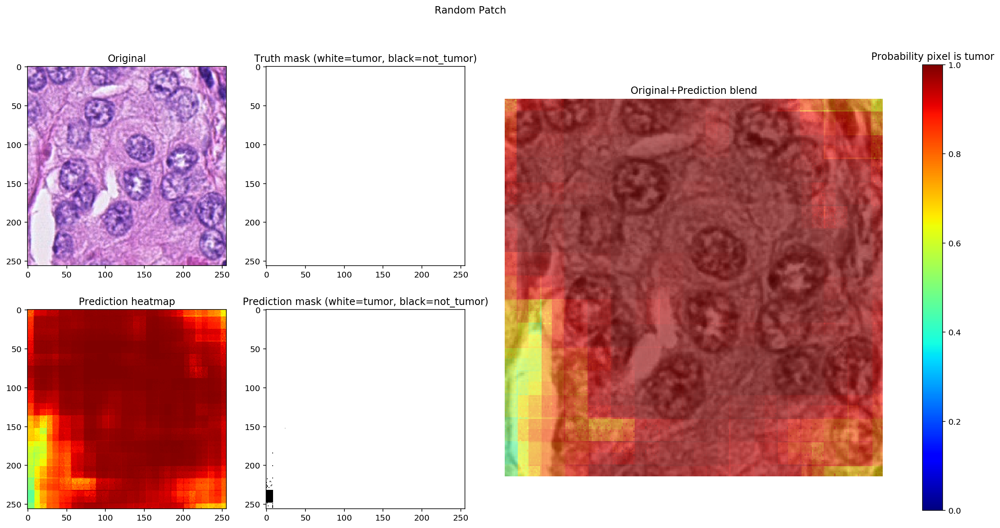

In [51]:
def get_random_patch_from_samples(samples, random_state=None):
    X_i, y_i = next(gen_imgs(samples.sample(1, random_state=random_state), 1))
    return X_i, y_i

X_i, y_i = get_random_patch_from_samples(samples)
pred_i = predict_from_model(X_i, model)
plot_patch_with_pred(X_i[0], y_i[0], pred_i, title_str='Random Patch')

In [52]:
from sklearn.metrics import confusion_matrix
from tqdm import tqdm

def predict_batch_from_model(patches, model):
    """Predict which pixels are tumor.
    
    input: patch: `batch_size`x256x256x3, rgb image
    input: model: keras model
    output: prediction: 256x256x1, per-pixel tumor probability
    """
    predictions = model.predict(patches)
    predictions = predictions[:, :, :, 1]
    return predictions

test_generator = gen_imgs(test_samples, BATCH_SIZE)
test_steps = np.ceil(len(test_samples) / BATCH_SIZE)

confusion_mtx = np.zeros((2, 2))

for i in tqdm(range(int(test_steps))):
    X, y  = next(test_generator)
    preds = predict_batch_from_model(X, model)
    
    y_true = y[:, :, :, 1].ravel()
    y_pred = np.uint8(preds > 0.5).ravel()
    
    confusion_mtx += confusion_matrix(y_true, y_pred, labels=[0, 1])

100%|██████████| 100/100 [27:24<00:00, 16.00s/it]


In [53]:
confusion_mtx


array([[7.58175280e+07, 4.53183800e+06],
       [2.30957700e+06, 1.27056257e+08]])

In [0]:
tn = confusion_mtx[0, 0]
fp = confusion_mtx[0, 1]
fn = confusion_mtx[1, 0]
tp = confusion_mtx[1, 1]

In [55]:
accuracy = (tp + tn) / (tp + tn + fp + fn)
recall = tp / (tp + fn)
precision = tp / (tp + fp)
f1_score = 2 * ((precision * recall) / (precision + recall))

print("Accuracy: %.2f" % accuracy)
print("Recall: %.2f" % recall)
print("Precision: %.2f" % precision)
print("F1 Score: %.2f" % f1_score)

Accuracy: 0.97
Recall: 0.98
Precision: 0.97
F1 Score: 0.97


In [56]:
#all_samples=samples
all_samples = find_patches_from_slide(slide_path17, filter_non_tissue=False)
#print('Total patches in slide: %d' % len(all_samples))
all_samples.iloc[:5]
all_samples.is_tumor.value_counts()

,is_tissue,slide_path,is_tumor,tile_loc
4609,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(227, 140)"
7595,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(205, 132)"
6528,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(36, 166)"
8175,True,/content/drive/My Drive/appdl_final/dataset/da...,True,"(135, 221)"
15921,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(399, 240)"


True     10000
False     6000
Name: is_tumor, dtype: int64

In [0]:
from matplotlib import cm
from tqdm import tqdm

output_dir = Path('/content/drive/My Drive/appdl_final/dataset/dataset')

alpha = 0.5

n_samples = len(all_samples)
n_cols = int(slide17.dimensions[0] / 256)
n_rows = int(slide17.dimensions[1] / 256)
#assert n_cols * n_rows == n_samples

thumbnail = slide17.get_thumbnail((n_cols, n_rows))
thumbnail = np.array(thumbnail)

# batch_size = n_cols
batch_size = 32
output_thumbnail_preds = list()
    
for offset in tqdm(list(range(0, n_samples, batch_size))):
    batch_samples = all_samples.iloc[offset:offset+batch_size]
    png_fnames = batch_samples.tile_loc.apply(lambda coord: str(output_dir / ('%d_%d.png' % coord[::-1])))
    
    X, _ = next(gen_imgs(batch_samples, batch_size, shuffle=False))
    
    if batch_samples.is_tissue.nunique() == 1 and batch_samples.iloc[0].is_tissue == False:
        # all patches in this row do not have tissue, skip them all
        output_thumbnail_preds.append(np.zeros(batch_size, dtype=np.float32))
        
        # output pngs
        for i, png_fname in enumerate(png_fnames):
            plt.imsave(png_fname, X[i])
    else:
        # make predictions
        preds = predict_batch_from_model(X, model)
        output_thumbnail_preds.append(preds.mean(axis=(1,2)))

        # overlay preds
        # save blended imgs
        for i, png_fname in enumerate(png_fnames):
            pred_i = preds[i]
            X_i = X[i]
            output_img = cv2.cvtColor(X_i, cv2.COLOR_RGB2GRAY)
            output_img2 = cv2.cvtColor(output_img.copy(), cv2.COLOR_GRAY2RGB)

            overlay = np.uint8(cm.jet(pred_i) * 255)[:,:,:3]
            blended = cv2.addWeighted(overlay, alpha, output_img2, 1-alpha, 0, output_img)
            
            plt.imsave(png_fname, blended)
        

output_thumbnail_preds = np.array(output_thumbnail_preds)

 61%|██████▏   | 307/500 [1:01:34<46:41, 14.52s/it]

In [0]:
!cd sample_data; ls

In [0]:
output_thumbnail_preds = output_thumbnail_preds.reshape(n_rows, n_cols)
truth = openslide.open_slide(tumor_mask_path17)

In [0]:
f, axes = plt.subplots(1, 2, figsize=(40, 18))
ax = axes.flatten()
plot_blend(thumbnail, output_thumbnail_preds, ax=ax[0])

thumbnail_truth = truth.get_thumbnail((truth.dimensions[0] / 256, truth.dimensions[1] / 256)) 
ax[1].imshow(thumbnail_truth.convert('L'), cmap='gray');
ax[0].set_title('Original+Predictions blend')
ax[1].set_title('Truth')
ax[1].axis('off');
plt.tight_layout();